In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
import matplotlib.image as mpimg
import cv2
%matplotlib inline

ImportError: No module named 'numpy'

# Data manipulation/generation
In this section we will explore the different ways that we can manipulate the data, and how we can use these manipulated images to create new training data

In [1]:
# First read in the data
df = pd.read_csv('driving_log.csv')

# And melt the data so that we have one image per row
center_df = df.loc[:,['center','steering','throttle','brake','speed']]
left_df = df.loc[:, ['left','steering','throttle','brake','speed']]
right_df = df.loc[:, ['right','steering','throttle','brake','speed']]
                  
# Rename the columns
left_df.columns = ['image_path', 'steering', 'throttle','brake','speed']
right_df.columns = ['image_path', 'steering', 'throttle','brake','speed']
center_df.columns = ['image_path', 'steering', 'throttle','brake','speed']

# Combine all data
all_frames = [center_df, left_df, right_df]
df = pd.concat(all_frames)


# Get rid of the white spaces
df['image_path'] = df['image_path'].apply(lambda x: x.strip(" "))
df

NameError: name 'pd' is not defined

0.0904655


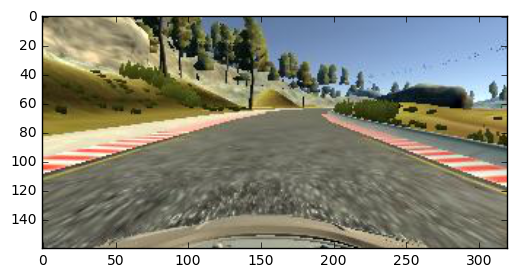

In [3]:
# Define a test image for us to see the effects of our function
test_image_row = df.iloc[300]
test_image = mpimg.imread(test_image_row.image_path)
plt.imshow(test_image)
print(test_image_row.steering)

In [4]:
def translate_image(image_data, x_translation, y_translation):
    """
    This function shifts the image by an amount of x_translation in the x axis, and y_translation in the y_axis
    
    :::params image_data : width x length x num_color_channel array
              x_translation: number of pixels to shift in the x direction
              y_translation: number of pixels to shift in the y direction
    """
    # Form the translation matrix
    translation_matrix = np.float32([[1, 0, x_translation], [0, 1, y_translation]])

    # Translate the image_data
    return (cv2.warpAffine(image_data, translation_matrix, (image_data.shape[1], image_data.shape[0])))

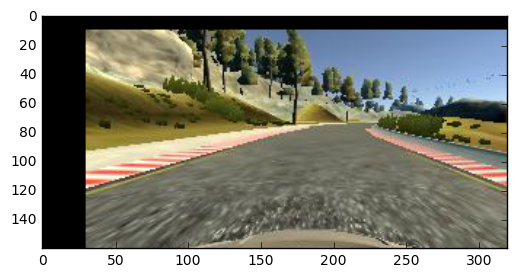

In [5]:
# Example use:
x_translation = 30
y_translation = 10
translated_image = translate_image(test_image, x_translation, y_translation)
plt.imshow(translated_image)

In [93]:
# Crop the image to get rid of the non-important features such as the car hood and the sky
def crop_image(image_data, x1, y1, x2, y2):
    """
    This function crops the images starting at (x1, y1) to (x2, y2)
    
    :::params image_data: width x length x num_color_channel array
              x1: starting x coordinate
              y1: starting y coordinate
              x2: ending x coordinate
              y2: ending y coordinate
    """
    
    return(image_data[:,x1:x2,y1:y2,:])

In [94]:
# Example use:
x1, y1, x2, y2 = 50,40,270,120
cropped_image = crop_image(translated_image, x1, y1, x2, y2)
plt.imshow(cropped_image)

IndexError: too many indices for array

In [8]:
def rgb2yuv(images):
    """
    This function converts an (n, width, length, n_color_channel) array from RGB space to YUV space
    
    ::param images: an (n, width, length, n_color_channel) array
    """
    rgb2yuv_matrix = np.array([[0.299, 0.587, 0.114], [-0.1473, -0.28886, 0.436],[0.615, -0.51499, 0.10001]])
    return(np.tensordot(images, rgb2yuv_matrix, axes=([3], [1])))

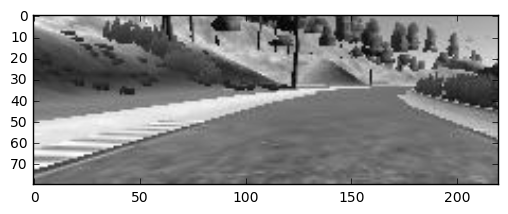

In [9]:
# Example use:
yuv_image = rgb2yuv([cropped_image])[0]
plt.imshow(yuv_image[:,:,0], cmap='gray')

In [10]:
# Normalizing the values so that they have a mean of 0 and standard deviation of 1
def normalize_image(images):
    """
    This function normalizes an array of images
    
    ::param images: an (n, width, length, n_color_channel) array
    """
    
    # Get the YUV columns
    y_col = images[:,:,:,0]
    u_col = images[:,:,:,1]
    v_col = images[:,:,:,2]
    
    # Find the mean and sd
    y_mean = np.mean(y_col)
    u_mean = np.mean(u_col)
    v_mean = np.mean(v_col)
    y_sd = np.sqrt(np.var(y_col))
    u_sd = np.sqrt(np.var(u_col))
    v_sd = np.sqrt(np.var(v_col))
    
    #     print("y_mean, u_mean, v_mean before normalization")
    #     print(y_mean, u_mean, v_mean)
    
    #     print("y_sd, u_sd, v_sd before normalization")
    #     print(y_sd, u_sd, v_sd)
    
    images[:,:,:,0] = (images[:,:,:,0] - y_mean)/y_sd
    images[:,:,:,1] = (images[:,:,:,1] - u_mean)/u_sd
    images[:,:,:,2] = (images[:,:,:,2] - v_mean)/v_sd
    return(images)

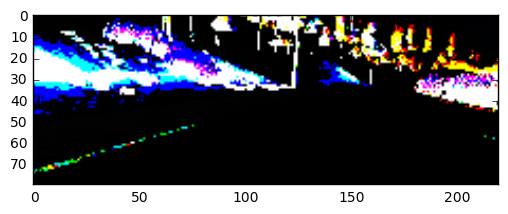

In [11]:
# Example use:
# First need to make it a 4-D array and copy the image as we can't change it since the cropped_image variable
# is just a pointer to the original data
normalized_image = normalize_image(np.reshape(cropped_image, (1, 80, 220, 3)).copy())[0]
plt.imshow(normalized_image[:,:,:])

In [12]:
def preprocess_image(images):
    """
    This is a helper function that combines the normalization and the color space mapping from RGB to YUV
    ::param images: an (n, width, length, n_color_channel) array

    """
    return normalize_image(rgb2yuv(images))

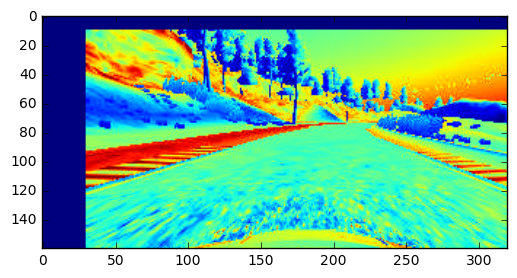

In [13]:
# Example use: (note here we have to wrap the image in an array to make it 4-D as this is what the rgb2yuv expects)
#              though after that it returns a 4-D tensor
processed_image = preprocess_image([translated_image])[0]
plt.imshow(processed_image[:,:,0])

In [14]:
### THIS IS A WORKING VERSION ###

def data_generator_1(df_row): 
    
    # Define the parameters for data manipulation
    TRANS_X_RANGE = 100
    TRANS_Y_RANGE = 0
    TRANS_ANGLE = 0.3
    CAMERA_STEERING_ANGLE_OFFSET = 0.15
    CROP_X1, CROP_Y1, CROP_X2, CROP_Y2 = 50,40,270,120
    
    # Get the image and steering
    path = df_row.image_path
    camera = path.split('/')[1].split("_")[0] # see if it is left, center or right
    steering_angle = df_row.steering

    # Show the image
    image_data = mpimg.imread(path)

    # Randomly compute a X,Y translation    

    # -TRANS_X_RANGE/2 <= x_translation <= TRANS_X_RANGE/2 so -50 to 50
    x_translation = (TRANS_X_RANGE * np.random.uniform()) - (TRANS_X_RANGE / 2) 

    # -TRANS_Y_RANGE/2 <= y_translation <= TRANS_Y_RANGE/2 so -20 to 20
    y_translation = (TRANS_Y_RANGE * np.random.uniform()) - (TRANS_Y_RANGE / 2)

    # Do the translation
    image_data = translate_image(image_data, x_translation, y_translation)

    # Calculate the new angle

    # Note here that if we translate left, then we would need to increase steering
    # Think of it as we are closer to the obstacle on the left, and vice versa for translate right
    new_steering_angle =  steering_angle + ((x_translation/TRANS_X_RANGE) * 2) * TRANS_ANGLE
    
    if camera == "left":
        new_steering_angle += CAMERA_STEERING_ANGLE_OFFSET
    elif camera == "right":
        new_steering_angle -= CAMERA_STEERING_ANGLE_OFFSET
    else:
        new_steering_angle = new_steering_angle

    # Now to make sure we can generalize to both left and right side 
    if np.random.uniform() <= 0.5:
        image_data = np.fliplr(image_data)
        new_steering_angle = -new_steering_angle
    
    # Crop the image
    image_data = crop_image(image_data, CROP_X1, CROP_Y1, CROP_X2, CROP_Y2)
    
    return(image_data, new_steering_angle)

In [15]:
def data_generator_2(df_row):
    # Define the parameters for data generation
    TRANS_X_RANGE = 100
    TRANS_Y_RANGE = 40
    TRANS_ANGLE = 0.15
    CAMERA_STEERING_ANGLE_OFFSET = 0.2
    CROP_X1, CROP_Y1, CROP_X2, CROP_Y2 = 50,40,270,120
    
    # Get the image and steering
    path = df_row.image_path
    camera = path.split('/')[1].split("_")[0] # see if it is left, center or right
    steering_angle = df_row.steering

    # Show the image
    image_data = mpimg.imread(path)

    # Randomly compute a X,Y translation    

    # -TRANS_X_RANGE/2 <= x_translation <= TRANS_X_RANGE/2 so -50 to 50
    x_translation = (TRANS_X_RANGE * np.random.uniform()) - (TRANS_X_RANGE / 2) 

    # -TRANS_Y_RANGE/2 <= y_translation <= TRANS_Y_RANGE/2 so -20 to 20
    y_translation = (TRANS_Y_RANGE * np.random.uniform()) - (TRANS_Y_RANGE / 2)

    # Do the translation
    image_data = translate_image(image_data, x_translation, y_translation)

    # Calculate the new angle

    # Note here that if we translate left, then we would need to increase steering
    # Think of it as we are closer to the obstacle on the left, and vice versa for translate right
    new_steering_angle =  steering_angle + ((x_translation/TRANS_X_RANGE) * 2) * TRANS_ANGLE
    
    if camera == "left":
        new_steering_angle += new_steering_angle * CAMERA_STEERING_ANGLE_OFFSET
    elif camera == "right":
        new_steering_angle -= new_steering_angle * CAMERA_STEERING_ANGLE_OFFSET
    else:
        new_steering_angle = new_steering_angle

    # Now to make sure we can generalize to both left and right side 
    if np.random.uniform() <= 0.5:
        image_data = np.fliplr(image_data)
        new_steering_angle = -new_steering_angle
    
    # Crop the image
    image_data = crop_image(image_data, CROP_X1, CROP_Y1, CROP_X2, CROP_Y2)
    
    return(image_data, new_steering_angle)

In [16]:
def data_generator_3(df_row):
    
    """
    This function creates a new training data point, and does so computing a random translation, then extrapolating
    a new angle from the old angle depending on how much the image was translated
    
    ::params df_row: this is a row of the data frame that contains the information associated with a picture
    
    returns an image_array, and an angle associated with that image
    """
    
    # Define the parameters for data generation 
    TRANS_X_RANGE = 100
    TRANS_Y_RANGE = 0 # Don't need to use this
    TRANS_ANGLE = 0.3
    CAMERA_STEERING_ANGLE_OFFSET = 0.1
    CROP_X1, CROP_Y1, CROP_X2, CROP_Y2 = 50,40,270,120
    
    # Get the image and steering
    path = df_row.image_path
    camera = path.split('/')[1].split("_")[0] # see if it is left, center or right
    steering_angle = df_row.steering

    # Show the image
    image_data = mpimg.imread(path)

    # Randomly compute a X,Y translation    

    # -TRANS_X_RANGE/2 <= x_translation <= TRANS_X_RANGE/2 so -50 to 50
    x_abs_max_translation = TRANS_X_RANGE / 2
    x_translation = (TRANS_X_RANGE * np.random.uniform()) - (x_abs_max_translation) 

    # -TRANS_Y_RANGE/2 <= y_translation <= TRANS_Y_RANGE/2 so -20 to 20
    y_abs_max_translation = TRANS_Y_RANGE / 2
    y_translation = (TRANS_Y_RANGE * np.random.uniform()) - (y_abs_max_translation)

    # Do the translation
    image_data = translate_image(image_data, x_translation, y_translation)

    # Calculate the new angle

    # Note here that if we translate left meaning a positive x_translation, then we would need to increase steering
    # This is because we shifted our view to the left so it seems like we are on the left side of the road
    # The same logic goes for the right side
    
    def _predict_angle(original_steering_angle, x_translation_ratio, angle_factor):
        if x_translation_ratio < 0:
            return(original_steering_angle + (-1) * angle_factor * x_translation_ratio**2)
        elif x_translation_ratio > 0:
            return(original_steering_angle + angle_factor * x_translation_ratio**2)
        else:
            return(original_steering_angle)
        
    x_translation_ratio = (x_translation/x_abs_max_translation) # between -1 and 1 
    new_steering_angle =  _predict_angle(steering_angle, x_translation_ratio, TRANS_ANGLE)
    
    if camera == "left":
        new_steering_angle += CAMERA_STEERING_ANGLE_OFFSET
    elif camera == "right":
        new_steering_angle -= CAMERA_STEERING_ANGLE_OFFSET
    else:
        new_steering_angle = new_steering_angle

    # Now to make sure we can generalize to both left and right side 
    if np.random.uniform() <= 0.5:
        image_data = np.fliplr(image_data)
        new_steering_angle = -new_steering_angle
    
    # Crop the image
    image_data = crop_image(image_data, CROP_X1, CROP_Y1, CROP_X2, CROP_Y2)
    
    return(image_data, new_steering_angle)

0.102587701508


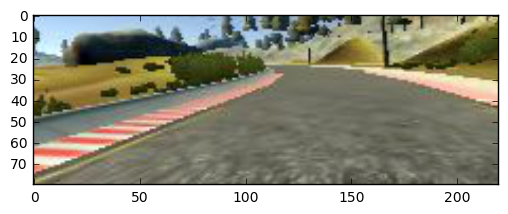

In [17]:
# Example use:
new_image_data, new_steering = data_generator_3(test_image_row)
plt.imshow(new_image_data)
print(new_steering)

# Data visualization
In this section the distribution of the steering angles is visualized, and also the kind of images that are associated with steering angles. Also a before and after comparison will be made of the distribution of steering angles after the new data is generated

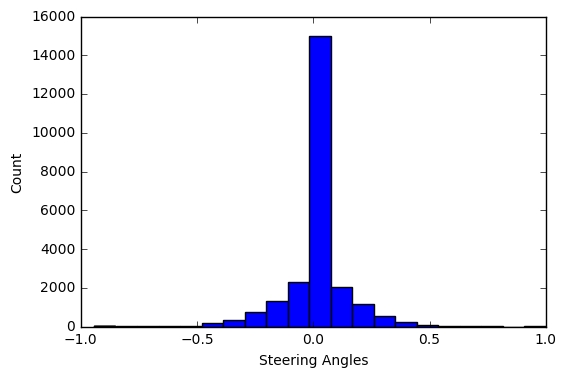

In [18]:
# Lets see a distribution of the steering angles
steering = df.steering
plt.hist(steering, bins = 21) # use 21 bins for each 0.1 interval
plt.xlabel("Steering Angles")
plt.ylabel("Count")

In [72]:
def get_data_in_bin(image_data, steering): 
    """
    The purpose of this function is to find a list of rows in a data frame that contains one of each of the
    steering angles in each bin, a bin contains the data that is associated with a certain range of 
    steering angles.
    
    :::params df: this a pandas data frame that has a steering column
    
    Returns a list that contains the selected rows from the data frame
    """
    image_data_in_bin = [] 
    steering_in_bin = []

    start = [i/10.0 for i in range(-10, 10, 1) ]
    end = [i/10.0 for i in range(-9, 11, 1)]
    bins = zip(start, end)
#     print(steering)
    for _bin in bins:
#         print(_bin[0], _bin[1])
        condition = (steering > _bin[0]) & (steering < _bin[1])
#         print(steering[np.where(condition)])
        idx_in_bin = np.where(condition)[0] 
        if len(idx_in_bin) > 0:
            sampled_idx = np.random.choice(idx_in_bin)
            image_data_in_bin.append(image_data[sampled_idx])
            steering_in_bin.append(steering[sampled_idx])
    return(np.array(image_data_in_bin), np.array(steering_in_bin))

In [80]:
# Plot some images from each bin
# Lets plot out the images associated with each bucket
import matplotlib.gridspec as gridspec

def plot_data_in_bin(image_data, steering):
    """
    This function plots the data using the output of get_data_in_bin
    
    params data: this is a list of data frame rows, one from each bin
    
    """
    
    # Define spacing between the plots
    fig = plt.figure(figsize=(75,75))
    gs = gridspec.GridSpec(5,5)

   
    # loop through the 
    for i in range(len(image_data)):
        ax = fig.add_subplot(gs[i])
        
        # If we have a row from the data frame, then we need to extract 
        # the raw data 
        ax.imshow(image_data[i])
        ax.set_title(steering[i])
    gs.tight_layout(fig)
    plt.show()
    

In [77]:
# Now lets create some new data and append it to the data frame
def create_data_set(initial_data_frame, data_generator, n_times, discard_prob, discard_range):
    """
    ::params data_generator: is the function used to generate the data
             
             n_times: is the number of times that the data should be generated
             
             discard_prob: is the probability that an angle between the discard_range 
             
             will be discarded
             
             discard_range: is the range of steering_angles that should be discarded
             
    """
    images_data = []
    steering_angles = []
    for i in range(n_times):
        
        # Get a random row from the data frame
        image_row = initial_data_frame.iloc[np.random.randint(initial_data_frame.shape[0])]
        
        # And its associated steering angle
        steering_angle = image_row.steering 
        
        # Generate a new data point
        generated_image_data, generated_steering_angle = data_generator(image_row)
        
        # Discard it with a probability of keep_prob or else add it to our list
        if (discard_range[0] <= steering_angle <= discard_range[1]):
            if np.random.uniform() > discard_prob:
                images_data.append(generated_image_data)
                steering_angles.append(generated_steering_angle)
        else:
            images_data.append(generated_image_data)
            steering_angles.append(generated_steering_angle)
            
        if i % 1000 == 0:
            print("Processed {0}/{1} data points".format(i, n_times))
    
    return(np.array(images_data), np.array(steering_angles))


In [84]:
# Helper function to extract the data in each bin and plot it
def extract_plot_bins(image_data, steering):
    image_data_in_bin, steering_in_bin = get_data_in_bin(image_data, steering)
    plot_data_in_bin(image_data_in_bin, steering_in_bin)

In [83]:
# See which of the three generators look better give better data
n_times = 1001
discard_range = (-0.1, 0.1)
discard_prob = 0.5
image_data_1, steering_1 = create_data_set(df, data_generator_1, n_times, discard_prob, discard_range)
image_data_2, steering_2 = create_data_set(df, data_generator_2, n_times, discard_prob, discard_range)
image_data_3, steering_3 = create_data_set(df, data_generator_3, n_times, discard_prob, discard_range)

Processed 0/1001 data points
Processed 1000/1001 data points


TypeError: get_data_in_bin() missing 1 required positional argument: 'steering'

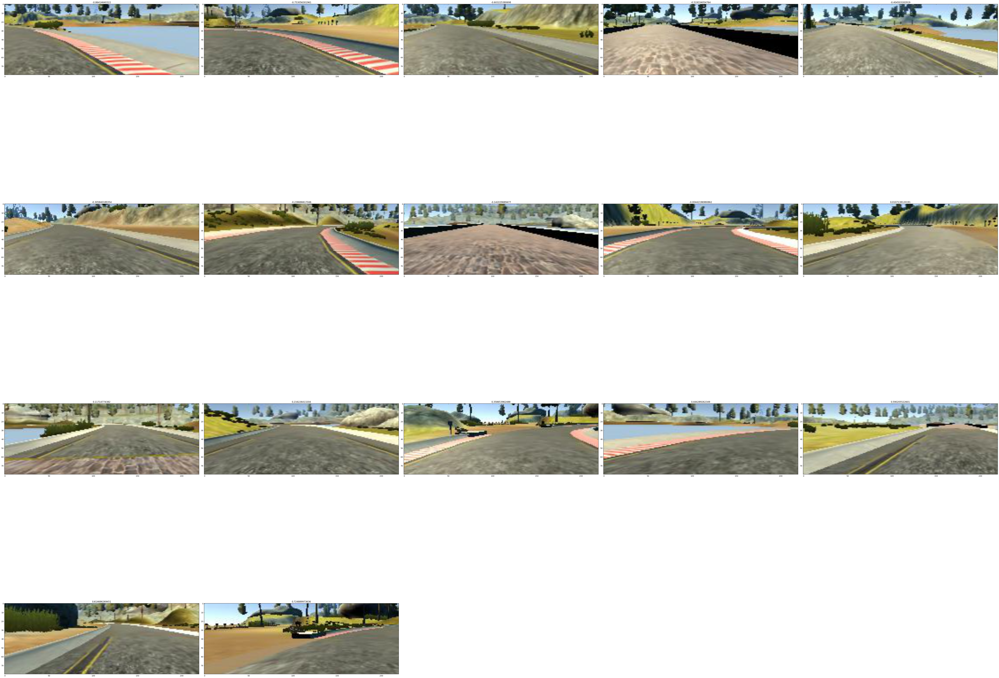

In [85]:
# Plot for data_generator_1
extract_plot_bins(image_data_1, steering_1)

In [88]:
extract_plot_bins(image_data_2, steering_2)

NameError: name 'image_data_2' is not defined

In [ ]:
extract_plot_bins(image_data_3, steering_3)

In [86]:
# Define the output folder and file name here
import os
FOLDER_NAME = "IMG1"
CSV_NAME  = "driving_log_1.csv"

def save_data(images_data, steering_angles, output_file):
    """
    ::params image_data: an (n x image_width x image_length x n_color_channel) 
             steering_angles: a (n x 1) array
    """
    
    # Make the directory if it doesn't exist
    os.makedirs(os.path.join(os.getcwd(),FOLDER_NAME), exist_ok = True)
    
    # Create a list to stored the data used to create the csv file
    image_angle_data = []
    
    for idx, image_data in enumerate(images_data):
        
        # Save the image
        image = Image.fromarray(image_data)
        image_name = str(idx) + ".jpg"
        image_path = os.path.join(FOLDER_NAME,image_name)
        image.save(image_path)     
        
        # Add the info the csv list
        image_angle_data.append([image_path, steering_angles[idx]])
    
    # Create a data frame from the csv file
    df = pd.DataFrame(image_angle_data)
    
    # Name the columns
    df.columns = ['image_path', 'steering' ]
    df.to_csv(output_file) 

In [ ]:
def retrieve_images(image_paths):
    image_data = []
    for idx, image_path in enumerate(image_paths):
        image_datum = mpimg.imread(image_path)
        image_data.append(image_datum)
        if idx % 1000 == 0:
            print("Processed {0}/{1} images".format(idx, len(image_paths)))
    return(image_data)

In [91]:
# Create new data for our prediction
n_times = 60000
discard_prob = 0.4
discard_range = (-0.1, 0.1)
created_image_data, created_steering_data = create_data_set(df, data_generator_1, n_times, discard_prob, discard_range)

# Save the new data

# new_df = pd.read_csv(CSV_NAME)

Processed 0/60000 data points
Processed 1000/60000 data points
Processed 2000/60000 data points
Processed 3000/60000 data points
Processed 4000/60000 data points
Processed 5000/60000 data points
Processed 6000/60000 data points
Processed 7000/60000 data points
Processed 8000/60000 data points
Processed 9000/60000 data points
Processed 10000/60000 data points
Processed 11000/60000 data points
Processed 12000/60000 data points
Processed 13000/60000 data points
Processed 14000/60000 data points
Processed 15000/60000 data points
Processed 16000/60000 data points
Processed 17000/60000 data points
Processed 18000/60000 data points
Processed 19000/60000 data points
Processed 20000/60000 data points
Processed 21000/60000 data points
Processed 22000/60000 data points
Processed 23000/60000 data points
Processed 24000/60000 data points
Processed 25000/60000 data points
Processed 26000/60000 data points
Processed 27000/60000 data points
Processed 28000/60000 data points
Processed 29000/60000 data 

(array([  1.00000000e+00,   1.00000000e+00,   1.00000000e+01,
          2.00000000e+01,   7.40000000e+01,   2.26000000e+02,
          6.96000000e+02,   2.36100000e+03,   4.72600000e+03,
          6.93100000e+03,   8.29500000e+03,   7.86300000e+03,
          5.84200000e+03,   3.33400000e+03,   1.24200000e+03,
          4.06000000e+02,   1.35000000e+02,   3.90000000e+01,
          1.40000000e+01,   2.00000000e+00,   2.00000000e+00]),
 array([-1.4315662 , -1.29830986, -1.16505353, -1.03179719, -0.89854085,
        -0.76528452, -0.63202818, -0.49877185, -0.36551551, -0.23225917,
        -0.09900284,  0.0342535 ,  0.16750983,  0.30076617,  0.43402251,
         0.56727884,  0.70053518,  0.83379151,  0.96704785,  1.10030419,
         1.23356052,  1.36681686]),
 <a list of 21 Patch objects>)

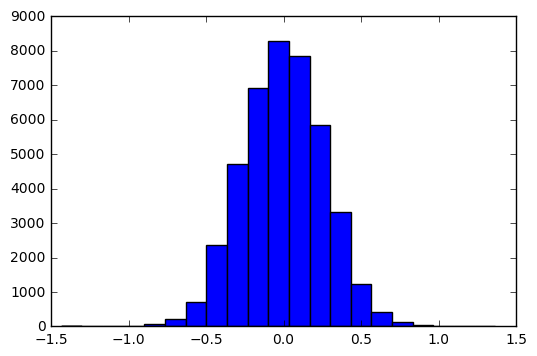

In [92]:
# Lets see the distribution of the steering angles for the new data
plt.hist(created_steering_data, bins = 21)

In [95]:
X = created_image_data
y = created_steering_data

In [96]:
# Now that we have our data lets split it into a test and train set

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size = 0.2)

In [97]:
print(X_train.shape, X_validation.shape, X_test.shape, y_train.shape, y_validation.shape, y_test.shape)

(27020, 80, 220, 3) (6756, 80, 220, 3) (8444, 80, 220, 3) (27020,) (6756,) (8444,)


Using TensorFlow backend.


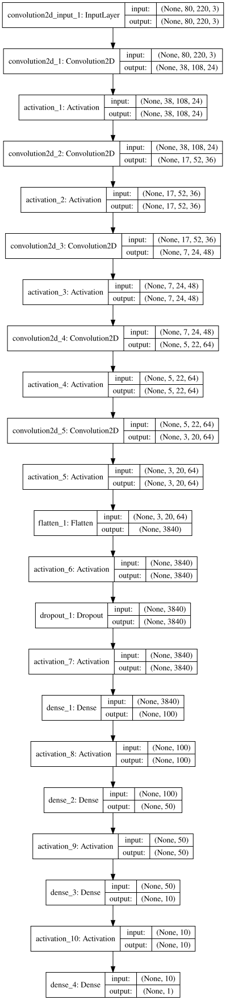

In [98]:
from keras.models import Sequential
from keras.layers.core import Dense, Activation, Flatten, Dropout
from keras.layers.convolutional import Convolution1D, Convolution2D, MaxPooling2D
from keras.activations import relu, softmax
from IPython.display import SVG, display
from keras.utils.visualize_util import model_to_dot
import keras

def get_nvidia_model():
    model = Sequential()

    model.add(Convolution2D(24, 5, 5, border_mode = "valid", subsample = (2,2), input_shape = (80,220,3)))
    model.add(Activation('relu'))

    model.add(Convolution2D(36, 5, 5, border_mode = "valid", subsample = (2,2)))
    model.add(Activation('relu'))

    model.add(Convolution2D(48, 5, 5, border_mode = "valid", subsample = (2,2)))
    model.add(Activation('relu'))

    model.add(Convolution2D(64, 3, 3, border_mode = "valid", subsample = (1,1)))
    model.add(Activation('relu'))

    model.add(Convolution2D(64, 3, 3, border_mode = "valid", subsample = (1,1)))
    model.add(Activation('relu'))

    model.add(Flatten())

    # Now use fully connected layers 
    model.add(Activation('relu'))
    model.add(Dropout(0.25))

    model.add(Activation('relu'))
    model.add(Dense(100))
    model.add(Activation('relu'))
    model.add(Dense(50))
    model.add(Activation('relu'))
    model.add(Dense(10))
    model.add(Activation('relu'))

    # Add the output layer
    model.add(Dense(1, init = 'normal'))

    # Define the optimizer
    adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0) 
    
    # Compile the model
    model.compile(loss = 'mean_squared_error', optimizer = adam)
    return(model)

model = get_nvidia_model()
# Show the model
display(SVG(model_to_dot(model, show_shapes=True).create(prog='dot', format='svg')))

In [99]:
# Define the hyperparameteres for training
BATCH_SIZE = 64
NB_EPOCH = 3
from sklearn.utils import shuffle

# Define the generator
def my_generator(X, y, batch_size):
#     print(X_train.shape[0])
#     X_train, y_train = shuffle(X_train, y_train)
    start = 0
    end = start + batch_size
    n_samples = X.shape[0]
    
    while True: 
        X_batch = preprocess_image(X[start:end])
        y_batch = y[start:end]
        start = end
        end = end + batch_size
        if start >= n_samples:
            X, y = shuffle(X, y)
            start = 0
            end = start + batch_size
        yield X_batch, y_batch

In [102]:
from keras.models import model_from_json

# See if we need to load a model
MODEL_JSON_FILE = "model.json"
MODEL_WEIGHT_FILE = "model.h5"
LOAD = False
if LOAD:
    # First load the structure of the neural network
    json_file = open(MODEL_JSON_FILE, "r")
    model_json = json_file.read()
    model = model_from_json(model_json)
    json_file.close()
    
    # Load the weights
    model.load_weights(MODEL_WEIGHT_FILE)
    
    # Define the optimizer
    adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0) 
    
    # Compile the model
    model.compile(loss = 'mean_squared_error', optimizer = adam) 

In [103]:
# Train the model
model.fit_generator(my_generator(X_train, y_train, BATCH_SIZE), samples_per_epoch = X_train.shape[0], nb_epoch = NB_EPOCH, validation_data = (preprocess_image(X_validation), y_validation))

Epoch 1/3
27020/27020 [==============================] - 452s - loss: 0.0139 - val_loss: 0.0121

In [106]:
# Now evaluate on our test set 
loss = model.evaluate(preprocess_image(X_test), y_test)
print(loss)

8444/8444 [==============================] - 46s     

In [107]:
# Now save the model
from keras.models import load_model
model.save_weights("model.h5")

In [108]:
model_json = model.to_json()
with open('model.json', 'w') as outfile:
    outfile.write(model_json)